# Importing Libraries

In [1]:
#importing libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from collections import OrderedDict
%matplotlib inline
sns.set()
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [2]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))

In [3]:
import warnings            #to ignore/avoid warnings on outputs
warnings.filterwarnings('ignore')

In [4]:
#importing dataset with the name 'df' 
df=pd.read_csv(r'C:\Users\opemi\Documents\DataLab Project Folder\strike_reports.csv')

In [5]:
df.head()

,INDEX_NR,INCIDENT_DATE,INCIDENT_MONTH,INCIDENT_YEAR,TIME,TIME_OF_DAY,AIRPORT_ID,AIRPORT,LATITUDE,LONGITUDE,RUNWAY,STATE,FAAREGION,LOCATION,OPID,OPERATOR,REG,FLT,AIRCRAFT,AMA,AMO,EMA,EMO,AC_CLASS,AC_MASS,TYPE_ENG,NUM_ENGS,ENG_1_POS,ENG_2_POS,ENG_3_POS,ENG_4_POS,PHASE_OF_FLIGHT,HEIGHT,SPEED,DISTANCE,SKY,PRECIPITATION,AOS,COST_REPAIRS,COST_OTHER,COST_REPAIRS_INFL_ADJ,COST_OTHER_INFL_ADJ,INGESTED,INDICATED_DAMAGE,DAMAGE_LEVEL,STR_RAD,DAM_RAD,STR_WINDSHLD,DAM_WINDSHLD,STR_NOSE,DAM_NOSE,STR_ENG1,DAM_ENG1,ING_ENG1,STR_ENG2,DAM_ENG2,ING_ENG2,STR_ENG3,DAM_ENG3,ING_ENG3,STR_ENG4,DAM_ENG4,ING_ENG4,STR_PROP,DAM_PROP,STR_WING_ROT,DAM_WING_ROT,STR_FUSE,DAM_FUSE,STR_LG,DAM_LG,STR_TAIL,DAM_TAIL,STR_LGHTS,DAM_LGHTS,STR_OTHER,DAM_OTHER,OTHER_SPECIFY,EFFECT,EFFECT_OTHER,BIRD_BAND_NUMBER,SPECIES_ID,SPECIES,REMARKS,REMAINS_COLLECTED,REMAINS_SENT,WARNED,NUM_SEEN,NUM_STRUCK,SIZE,ENROUTE_STATE,NR_INJURIES,NR_FATALITIES,COMMENTS,REPORTED_NAME,REPORTED_TITLE,SOURCE,PERSON,LUPDATE,TRANSFER
0,608274,15/10/1990,10,1990,NaN,Night,KMIE,DELAWARE COUNTY REGIONAL ARPT,40.242,-85.396,NaN,IN,AGL,NaN,PVT,PRIVATELY OWNED,NaN,NaN,C-172,226,7,7.000,10,A,1.000,A,1.000,7.000,NaN,NaN,NaN,Approach,200.000,70.000,NaN,No Cloud,None,NaN,NaN,NaN,NaN,NaN,False,False,N,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,NaN,NaN,NaN,UNKBS,Unknown bird - small,NO DAMAGE,False,False,No,1,1,Small,NaN,NaN,NaN,OPER = CHARLES WEATHERLY /Legacy Record=100033/,REDACTED,REDACTED,FAA Form 5200-7,Tower,04/12/1998,False
1,608275,01/08/1993,8,1993,NaN,Day,KMSY,LOUIE ARMSTRONG NEW ORLEANS INTL ARPT,29.993,-90.258,1,LA,ASW,NaN,TWA,TRANS WORLD AIRLINES,NaN,NaN,B-727,148,94,34.000,10,A,4.000,D,3.000,5.000,6.000,5.000,NaN,Landing Roll,0.000,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,N,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,None,NaN,NaN,UNKBM,Unknown bird - medium,NO DAMAGE REPTD. TIME = 1850Z,False,False,Unknown,NaN,1,Medium,NaN,NaN,NaN,/Legacy Record=100034/,REDACTED,REDACTED,AC Incident Rept,Tower,24/05/2005,False
2,608276,18/08/1996,8,1996,NaN,NaN,KORD,CHICAGO O'HARE INTL ARPT,41.980,-87.904,22R,IL,AGL,NaN,UAL,UNITED AIRLINES,NaN,1228.000,B-757-200,148,26,34.000,40,A,4.000,D,2.000,1.000,1.000,NaN,NaN,Landing Roll,0.000,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,N,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,NaN,NaN,NaN,ZT1,Blackbirds,BLACKBIRD.,False,False,Unknown,NaN,1,Small,NaN,NaN,NaN,/Legacy Record=100035/,REDACTED,REDACTED,Air Transport Report,Air Transport Operations,20/12/2007,False
3,608277,19/09/1993,9,1993,NaN,Day,KMHT,MANCHESTER AIRPORT,42.935,-71.437,35,NH,ANE,NaN,PVT,PRIVATELY OWNED,N19CT,NaN,BE-33,123,6,13.000,16,A,1.000,A,1.000,7.000,NaN,NaN,NaN,Approach,1800.000,150.000,8.000,No Cloud,None,NaN,NaN,NaN,NaN,NaN,False,True,S,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,Precautionary Landing,NaN,NaN,UNKBL,Unknown bird - large,A/C WAS 8NM SE OF ARPT & OBSERVED SEV. BIRDS P...,False,False,No,02-Oct,1,Large,NaN,NaN,NaN,SOURCE = 5200-7 & NON-COM INCIDENT REPT.OPERAT...,REDACTED,REDACTED,Multiple,Tower,11/05/1998,False
4,608278,23/03/1991,3,1991,NaN,Night,KELP,EL PASO INTL ARPT,31.807,-106.378,26L,TX,ASW,NaN,AAL,AMERICAN AIRLINES,N887AA,NaN,B-727,148,94,34.000,10,A,4.000,D,3.000,5.000,6.000,5.000,NaN,Approach,200.000,135.000,NaN,No Cloud,None,NaN,NaN,NaN,NaN,NaN,False,False,N,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,

In [6]:
df.shape

(255929, 100)

In [7]:
df.isnull().sum()       #to check for missing values in each column

INDEX_NR                      0
INCIDENT_DATE                 0
INCIDENT_MONTH                0
INCIDENT_YEAR                 0
TIME                     121042
TIME_OF_DAY              106427
AIRPORT_ID                    0
AIRPORT                       0
LATITUDE                  31244
LONGITUDE                 31244
RUNWAY                    62357
STATE                     31244
FAAREGION                 31244
LOCATION                 226150
OPID                          9
OPERATOR                      0
REG                      103832
FLT                      144439
AIRCRAFT                      0
AMA                       71654
AMO                       82503
EMA                       87148
EMO                       90368
AC_CLASS                  70465
AC_MASS                   70963
TYPE_ENG                  71383
NUM_ENGS                  71153
ENG_1_POS                 71840
ENG_2_POS                 83956
ENG_3_POS                243317
ENG_4_POS                252876
PHASE_OF

In [8]:
df['PRECIPITATION'].unique()

array(['None', nan, 'Fog', 'Rain', 'Snow', 'Fog, Rain', 'Rain, Snow',
       'Fog, Snow', 'Fog, Rain, Snow', 'None, Snow', 'Fog, None',
       'None, Rain', 'None, Rain, Snow'], dtype=object)

In [9]:
len(df['PRECIPITATION'].unique())

13

In [10]:
df['PRECIPITATION']=df['PRECIPITATION'].replace('None, Snow','Snow')
df['PRECIPITATION']=df['PRECIPITATION'].replace('Fog, None','None')
df['PRECIPITATION']=df['PRECIPITATION'].replace('None, Rain','Rain')
df['PRECIPITATION']=df['PRECIPITATION'].replace('None, Rain, Snow','Rain, Snow')

In [11]:
df['SKY'].value_counts()

No Cloud      61040
Some Cloud    43866
Overcast      21988
Name: SKY, dtype: int64

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 255929 entries, 0 to 255928
Data columns (total 100 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   INDEX_NR               255929 non-null  int64  
 1   INCIDENT_DATE          255929 non-null  object 
 2   INCIDENT_MONTH         255929 non-null  int64  
 3   INCIDENT_YEAR          255929 non-null  int64  
 4   TIME                   134887 non-null  object 
 5   TIME_OF_DAY            149502 non-null  object 
 6   AIRPORT_ID             255929 non-null  object 
 7   AIRPORT                255929 non-null  object 
 8   LATITUDE               224685 non-null  float64
 9   LONGITUDE              224685 non-null  float64
 10  RUNWAY                 193572 non-null  object 
 11  STATE                  224685 non-null  object 
 12  FAAREGION              224685 non-null  object 
 13  LOCATION               29779 non-null   object 
 14  OPID                   255920 non-n

In [13]:
percentage_of_missing_values=round(100*(df.isnull().sum()/len(df.index)),2)
percentage_of_missing_values

INDEX_NR                 0.000
INCIDENT_DATE            0.000
INCIDENT_MONTH           0.000
INCIDENT_YEAR            0.000
TIME                    47.300
TIME_OF_DAY             41.580
AIRPORT_ID               0.000
AIRPORT                  0.000
LATITUDE                12.210
LONGITUDE               12.210
RUNWAY                  24.360
STATE                   12.210
FAAREGION               12.210
LOCATION                88.360
OPID                     0.000
OPERATOR                 0.000
REG                     40.570
FLT                     56.440
AIRCRAFT                 0.000
AMA                     28.000
AMO                     32.240
EMA                     34.050
EMO                     35.310
AC_CLASS                27.530
AC_MASS                 27.730
TYPE_ENG                27.890
NUM_ENGS                27.800
ENG_1_POS               28.070
ENG_2_POS               32.800
ENG_3_POS               95.070
ENG_4_POS               98.810
PHASE_OF_FLIGHT         37.540
HEIGHT  

In [14]:
#Dropping columns based on irrelevance and too many missing values

df.drop(['INDEX_NR','LOCATION', 'AOS', 'COST_REPAIRS','COST_OTHER','COST_REPAIRS_INFL_ADJ','COST_OTHER_INFL_ADJ',
        'OTHER_SPECIFY','EFFECT_OTHER','BIRD_BAND_NUMBER','NR_INJURIES','NR_FATALITIES',
         'ENROUTE_STATE','SPEED','NUM_SEEN','FLT','COMMENTS','REMARKS'], axis=1, inplace=True)

In [15]:
df.drop(['EMO','EMA','AMA','AMO'], axis=1, inplace=True)

In [16]:
df.drop(['NUM_STRUCK','OPID'], axis=1, inplace=True)

In [17]:
df.isnull().sum()

INCIDENT_DATE             0
INCIDENT_MONTH            0
INCIDENT_YEAR             0
TIME                 121042
TIME_OF_DAY          106427
AIRPORT_ID                0
AIRPORT                   0
LATITUDE              31244
LONGITUDE             31244
RUNWAY                62357
STATE                 31244
FAAREGION             31244
OPERATOR                  0
REG                  103832
AIRCRAFT                  0
AC_CLASS              70465
AC_MASS               70963
TYPE_ENG              71383
NUM_ENGS              71153
ENG_1_POS             71840
ENG_2_POS             83956
ENG_3_POS            243317
ENG_4_POS            252876
PHASE_OF_FLIGHT       96074
HEIGHT               120299
DISTANCE              91888
SKY                  129035
PRECIPITATION        133520
INGESTED                  0
INDICATED_DAMAGE          0
DAMAGE_LEVEL          87222
STR_RAD                   0
DAM_RAD                   0
STR_WINDSHLD              0
DAM_WINDSHLD              0
STR_NOSE            

In [18]:
round(100*(df.isnull().sum()/len(df.index)),2)

INCIDENT_DATE        0.000
INCIDENT_MONTH       0.000
INCIDENT_YEAR        0.000
TIME                47.300
TIME_OF_DAY         41.580
AIRPORT_ID           0.000
AIRPORT              0.000
LATITUDE            12.210
LONGITUDE           12.210
RUNWAY              24.360
STATE               12.210
FAAREGION           12.210
OPERATOR             0.000
REG                 40.570
AIRCRAFT             0.000
AC_CLASS            27.530
AC_MASS             27.730
TYPE_ENG            27.890
NUM_ENGS            27.800
ENG_1_POS           28.070
ENG_2_POS           32.800
ENG_3_POS           95.070
ENG_4_POS           98.810
PHASE_OF_FLIGHT     37.540
HEIGHT              47.000
DISTANCE            35.900
SKY                 50.420
PRECIPITATION       52.170
INGESTED             0.000
INDICATED_DAMAGE     0.000
DAMAGE_LEVEL        34.080
STR_RAD              0.000
DAM_RAD              0.000
STR_WINDSHLD         0.000
DAM_WINDSHLD         0.000
STR_NOSE             0.000
DAM_NOSE             0.000
S

In [19]:
df.drop(['AIRPORT_ID','STATE','TIME','SPECIES','AC_CLASS'], axis=1, inplace=True)

# Inputting Using Fillna

In [20]:
df['DISTANCE'].mean()

0.7852342097402487

In [21]:
df['HEIGHT']=df['HEIGHT'].fillna(df['HEIGHT'].mean())
df['DISTANCE'].fillna(df['DISTANCE'].mean(), inplace=True)

In [22]:
df['LATITUDE']=df['LATITUDE'].fillna(df['LATITUDE'].mode()[0])
df['PHASE_OF_FLIGHT'].fillna(df['PHASE_OF_FLIGHT'].mode()[0], inplace=True)

In [23]:
#df['LATITUDE'].mode()[0]

In [24]:
#df2=df[df['LATITUDE']==df['LATITUDE'].mode()[0]]

In [25]:
#df2['LONGITUDE']

In [26]:
df['LONGITUDE'].fillna(-104.667, inplace=True)

In [27]:
df.drop(['REG'], axis=1, inplace=True)

In [28]:
df.drop(['RUNWAY'], axis=1, inplace=True)

In [29]:
round(100*(df.isnull().sum()/len(df.index)),5)

INCIDENT_DATE        0.000
INCIDENT_MONTH       0.000
INCIDENT_YEAR        0.000
TIME_OF_DAY         41.585
AIRPORT              0.000
LATITUDE             0.000
LONGITUDE            0.000
FAAREGION           12.208
OPERATOR             0.000
AIRCRAFT             0.000
AC_MASS             27.728
TYPE_ENG            27.892
NUM_ENGS            27.802
ENG_1_POS           28.070
ENG_2_POS           32.804
ENG_3_POS           95.072
ENG_4_POS           98.807
PHASE_OF_FLIGHT      0.000
HEIGHT               0.000
DISTANCE             0.000
SKY                 50.418
PRECIPITATION       52.171
INGESTED             0.000
INDICATED_DAMAGE     0.000
DAMAGE_LEVEL        34.081
STR_RAD              0.000
DAM_RAD              0.000
STR_WINDSHLD         0.000
DAM_WINDSHLD         0.000
STR_NOSE             0.000
DAM_NOSE             0.000
STR_ENG1             0.000
DAM_ENG1             0.000
ING_ENG1             0.000
STR_ENG2             0.000
DAM_ENG2             0.000
ING_ENG2             0.000
S

In [30]:
df['AC_MASS'].unique()

array([ 1.,  4.,  2.,  3., nan,  5.])

In [31]:
df['SIZE']=df['SIZE'].fillna(df['SIZE'].mode()[0])
df['AC_MASS'].fillna(df['AC_MASS'].mode()[0], inplace=True)

In [32]:
df['TYPE_ENG']=df['TYPE_ENG'].fillna(df['TYPE_ENG'].mode()[0])
df['NUM_ENGS'].fillna(df['NUM_ENGS'].mode()[0], inplace=True)

In [33]:
df['ENG_1_POS']=df['ENG_1_POS'].fillna(df['ENG_1_POS'].mode()[0])
df['ENG_2_POS'].fillna(df['ENG_2_POS'].mode()[0], inplace=True)

In [34]:
df['DAMAGE_LEVEL']=df['DAMAGE_LEVEL'].fillna(df['DAMAGE_LEVEL'].mode()[0])
df['PRECIPITATION'].fillna(df['PRECIPITATION'].mode()[0], inplace=True)

In [35]:
df['EFFECT']=df['EFFECT'].fillna(df['EFFECT'].mode()[0])
df['PERSON'].fillna(df['PERSON'].mode()[0], inplace=True)

In [36]:
round(100*(df.isnull().sum()/len(df.index)),2)

INCIDENT_DATE        0.000
INCIDENT_MONTH       0.000
INCIDENT_YEAR        0.000
TIME_OF_DAY         41.580
AIRPORT              0.000
LATITUDE             0.000
LONGITUDE            0.000
FAAREGION           12.210
OPERATOR             0.000
AIRCRAFT             0.000
AC_MASS              0.000
TYPE_ENG             0.000
NUM_ENGS             0.000
ENG_1_POS            0.000
ENG_2_POS            0.000
ENG_3_POS           95.070
ENG_4_POS           98.810
PHASE_OF_FLIGHT      0.000
HEIGHT               0.000
DISTANCE             0.000
SKY                 50.420
PRECIPITATION        0.000
INGESTED             0.000
INDICATED_DAMAGE     0.000
DAMAGE_LEVEL         0.000
STR_RAD              0.000
DAM_RAD              0.000
STR_WINDSHLD         0.000
DAM_WINDSHLD         0.000
STR_NOSE             0.000
DAM_NOSE             0.000
STR_ENG1             0.000
DAM_ENG1             0.000
ING_ENG1             0.000
STR_ENG2             0.000
DAM_ENG2             0.000
ING_ENG2             0.000
S

In [37]:
df['SKY'].unique()

array(['No Cloud', nan, 'Overcast', 'Some Cloud'], dtype=object)

In [38]:
df['SKY'].mode()

0    No Cloud
dtype: object

In [39]:
df['SKY'].fillna(df['SKY'].mode()[0], inplace=True)

In [40]:
df['TIME_OF_DAY'].unique()

array(['Night', 'Day', nan, 'Dawn', 'Dusk'], dtype=object)

In [41]:
df['TIME_OF_DAY'].fillna(df['TIME_OF_DAY'].mode()[0], inplace=True)

In [42]:
df['FAAREGION'].fillna(df['FAAREGION'].mode()[0], inplace=True)

In [43]:
df.drop(['LUPDATE', 'TRANSFER', 'REPORTED_NAME','REPORTED_TITLE','SPECIES_ID'], axis=1, inplace=True)

In [44]:
df['ENG_3_POS'].fillna(-1, inplace=True)

In [45]:
df['ENG_4_POS'].fillna(-1, inplace=True)

# Coverting Data Types 

In [46]:
df['INCIDENT_DATE']=pd.to_datetime(df['INCIDENT_DATE'], format='%d/%m/%Y')

In [47]:
df.dtypes

INCIDENT_DATE        datetime64[ns]
INCIDENT_MONTH                int64
INCIDENT_YEAR                 int64
TIME_OF_DAY                  object
AIRPORT                      object
LATITUDE                    float64
LONGITUDE                   float64
FAAREGION                    object
OPERATOR                     object
AIRCRAFT                     object
AC_MASS                     float64
TYPE_ENG                     object
NUM_ENGS                    float64
ENG_1_POS                   float64
ENG_2_POS                   float64
ENG_3_POS                   float64
ENG_4_POS                   float64
PHASE_OF_FLIGHT              object
HEIGHT                      float64
DISTANCE                    float64
SKY                          object
PRECIPITATION                object
INGESTED                       bool
INDICATED_DAMAGE               bool
DAMAGE_LEVEL                 object
STR_RAD                        bool
DAM_RAD                        bool
STR_WINDSHLD                

# EXPLORATORY DATA ANALYSIS - DATA VISUALIZATION 

In [48]:
df['INCIDENT_YEAR'].unique()

array([1990, 1993, 1996, 1991, 1995, 1992, 1994, 1997, 1998, 1999, 2000,
       2001, 2007, 2005, 2006, 2008, 2009, 2002, 2004, 2003, 2015, 2010,
       2011, 2012, 2013, 2014, 2016, 2017, 2018, 2019, 2020, 2021],
      dtype=int64)

In [49]:
from collections import Counter

In [50]:
strikes_per_year=Counter(df['INCIDENT_YEAR'])
years=(list(strikes_per_year.keys()))
strikes_years = (list(strikes_per_year.values()))
 

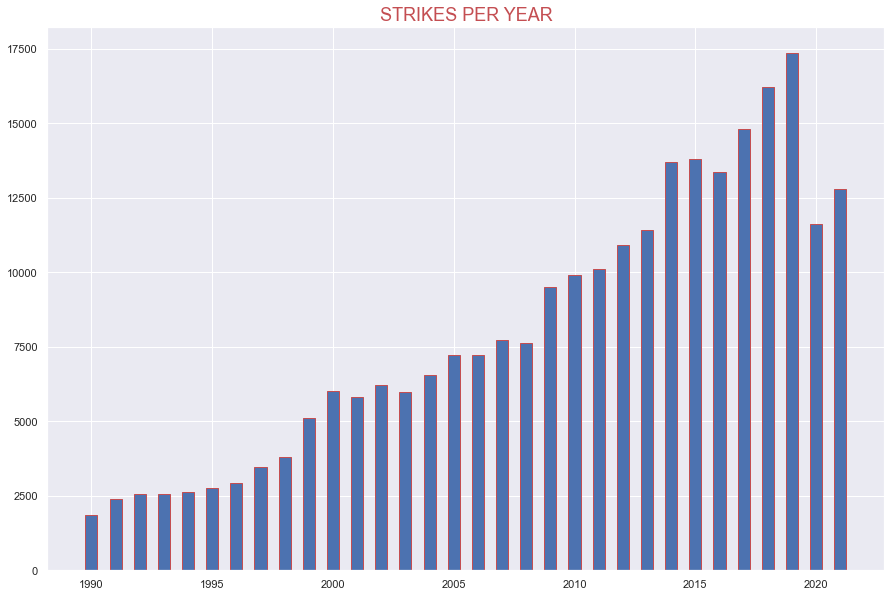

In [51]:
fig=plt.figure(figsize=(15,10))
plt.title('STRIKES PER YEAR',fontsize=18,c='r')
plt.bar(years,strikes_years, edgecolor='r',width=0.5,color='b')
plt.show()   

In [52]:
fig.savefig('SPY.png')

In [53]:
strikes_per_month=Counter(df['INCIDENT_MONTH'])
months=(list(strikes_per_month.keys()))
strikes_month = (list(strikes_per_month.values()))

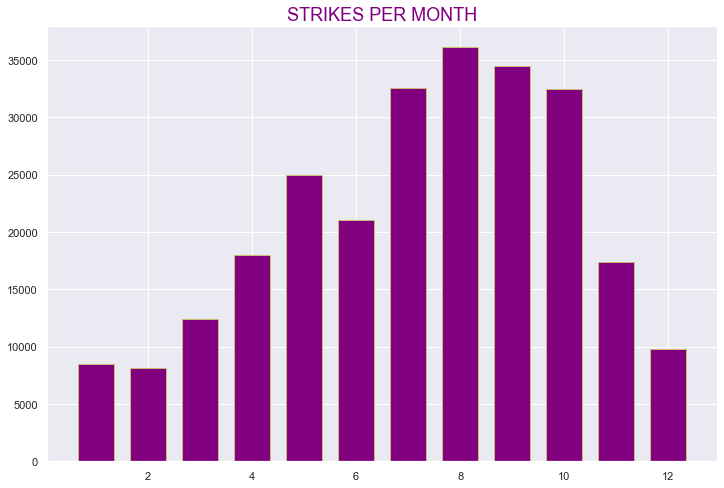

In [54]:
fig=plt.figure(figsize=(12,8))
plt.title('STRIKES PER MONTH',fontsize=18,c='purple')
plt.bar(months,strikes_month, edgecolor='y',width=0.7,color='purple')
plt.show()   

In [55]:
fig.savefig('SPM.png')

In [56]:
strikes_per_region=Counter(df['FAAREGION'])
regions=(list(strikes_per_region.keys()))
strikes_region = (list(strikes_per_region.values()))

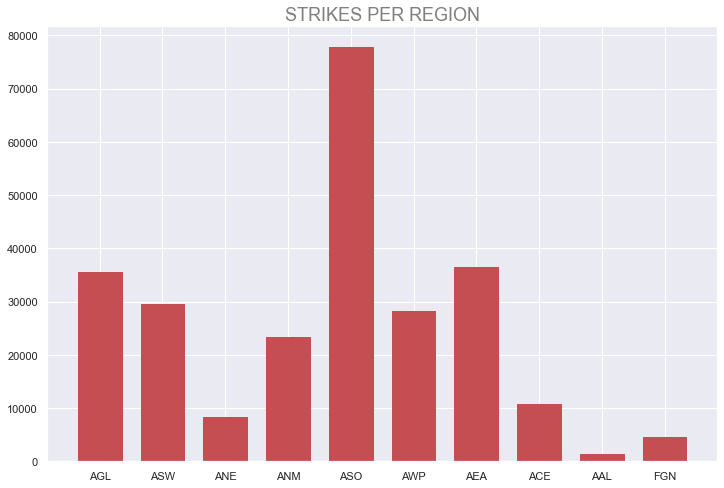

In [57]:
fig=plt.figure(figsize=(12,8))
plt.title('STRIKES PER REGION',fontsize=18,c='grey')
plt.bar(regions,strikes_region, edgecolor='r',width=0.7,color='r')
plt.show() 

In [58]:
fig.savefig('SPS.png')

In [59]:
bird_strikes_month=df['INCIDENT_MONTH']
def strike_season(bird_strikes_month):
    if bird_strikes_month >= 3 and bird_strikes_month <= 5:
        return 'Spring'
    elif bird_strikes_month >= 6 and bird_strikes_month <= 8:
        return 'Summer'
    elif bird_strikes_month >= 9 and bird_strikes_month <= 11:
        return 'Fall'
    else:
        return 'Winter'
    
bird_strikes_season=bird_strikes_month.apply(strike_season)

In [60]:
bird_strikes_season

0           Fall
1         Summer
2         Summer
3           Fall
4         Spring
5           Fall
6         Summer
7         Spring
8         Summer
9         Spring
10        Spring
11        Summer
12        Spring
13        Summer
14        Spring
15        Summer
16        Summer
17        Summer
18        Spring
19        Summer
20          Fall
21          Fall
22        Summer
23        Spring
24        Spring
25          Fall
26          Fall
27        Summer
28        Summer
29          Fall
30        Summer
31        Summer
32        Summer
33        Summer
34        Spring
35          Fall
36          Fall
37        Spring
38        Summer
39          Fall
40        Summer
41          Fall
42          Fall
43        Summer
44        Summer
45        Summer
46        Summer
47        Summer
48          Fall
49        Winter
50          Fall
51          Fall
52        Spring
53        Summer
54          Fall
55        Summer
56        Winter
57          Fall
58        Spri

In [61]:
strikes_per_season=Counter(bird_strikes_season)
seasons=list(strikes_per_season.keys())
strikes_seasons=list(strikes_per_season.values())

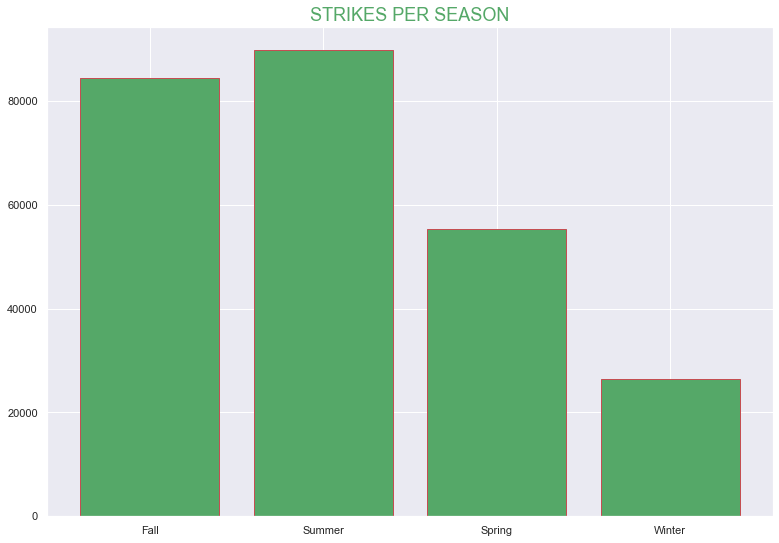

In [62]:
fig=plt.figure(figsize=(13,9))
plt.title('STRIKES PER SEASON',fontsize=18,c='g')
plt.bar(seasons,strikes_seasons, edgecolor='r',width=0.8,color='g')
plt.show() 

In [63]:
fig.savefig('SPSS.png')

In [64]:
flight_phase_strikes = Counter(df['PHASE_OF_FLIGHT'])
phase= list(flight_phase_strikes.keys())
strikes_phase=list(flight_phase_strikes.values())

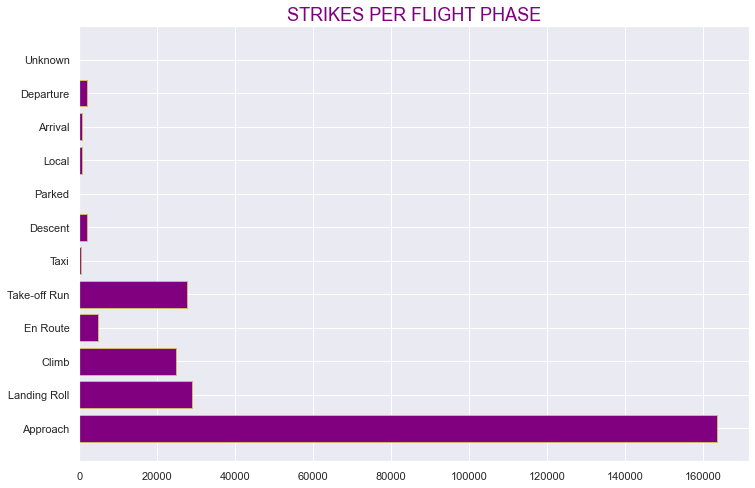

In [65]:
fig=plt.figure(figsize=(12,8))
plt.title('STRIKES PER FLIGHT PHASE',fontsize=18,c='purple')
plt.barh(phase,strikes_phase, edgecolor='y',color='purple')
plt.show()  

In [66]:
fig.savefig('SPPH.png')

In [67]:
strikes_per_size =Counter(df['SIZE'])
size= list(strikes_per_size.keys())
strikes_size=list(strikes_per_size.values())

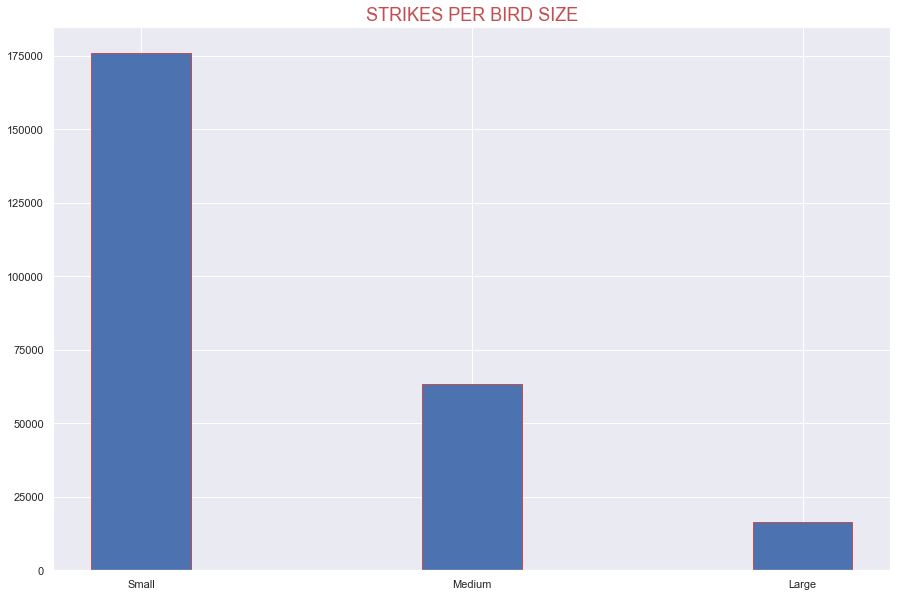

In [68]:
fig=plt.figure(figsize=(15,10))
plt.title('STRIKES PER BIRD SIZE',fontsize=18,c='r')
plt.bar(size,strikes_size, edgecolor='r',width=0.3,color='b')
plt.show()   

In [69]:
fig.savefig('SPBS.png')

In [70]:
strikes_per_mass =Counter(df['AC_MASS'])
mass= list(strikes_per_mass.keys())
strikes_mass=list(strikes_per_mass.values())

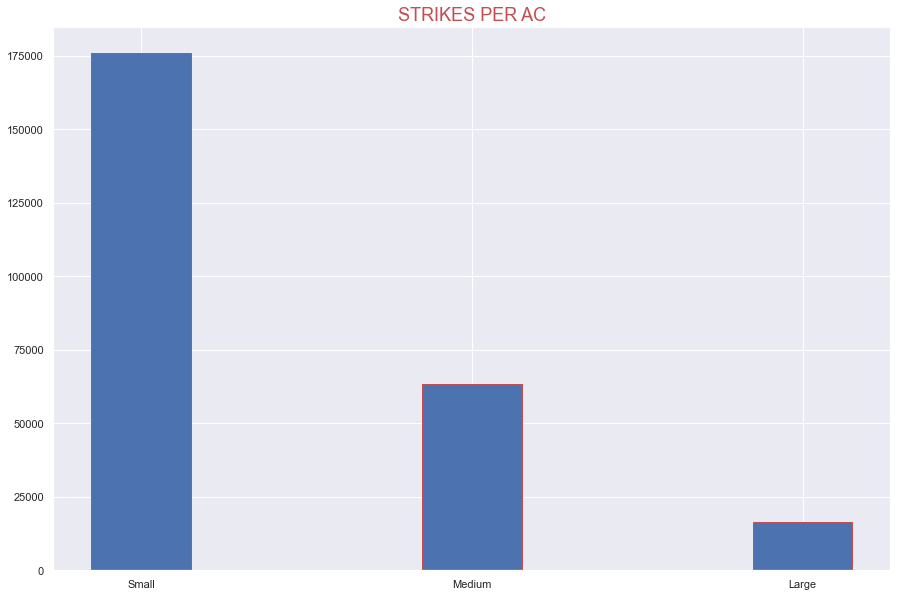

In [71]:
fig=plt.figure(figsize=(15,10))
plt.title('STRIKES PER AC',fontsize=18,c='r')
plt.bar(size,strikes_size, edgecolor='r',width=0.3,color='b')
plt.show()

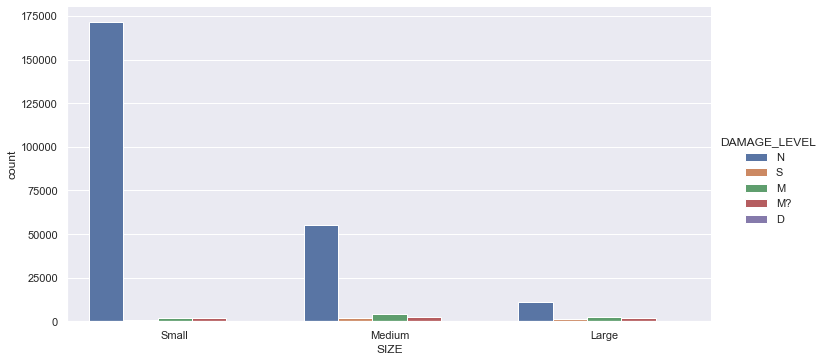

In [74]:
sns.catplot(x='SIZE', hue='DAMAGE_LEVEL',kind='count',data=df, height=5, aspect=2)

In [75]:
fig.savefig('SPDL.png')

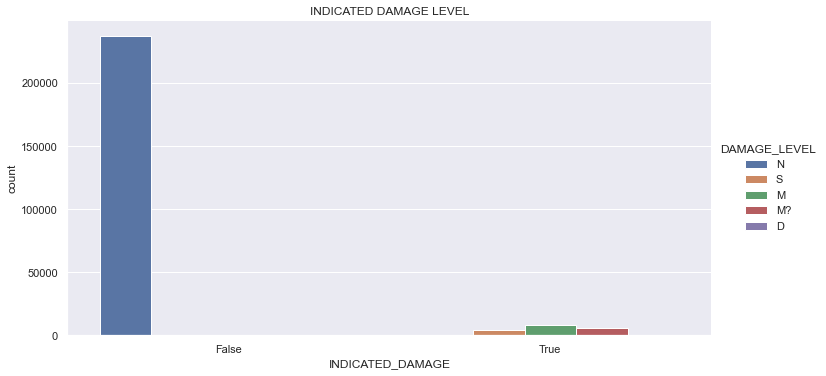

In [76]:
sns.catplot(x='INDICATED_DAMAGE', hue='DAMAGE_LEVEL',kind='count',data=df, 
            height=5, aspect=2).set(title='INDICATED DAMAGE LEVEL')

In [77]:
fig.savefig('SPID.png')

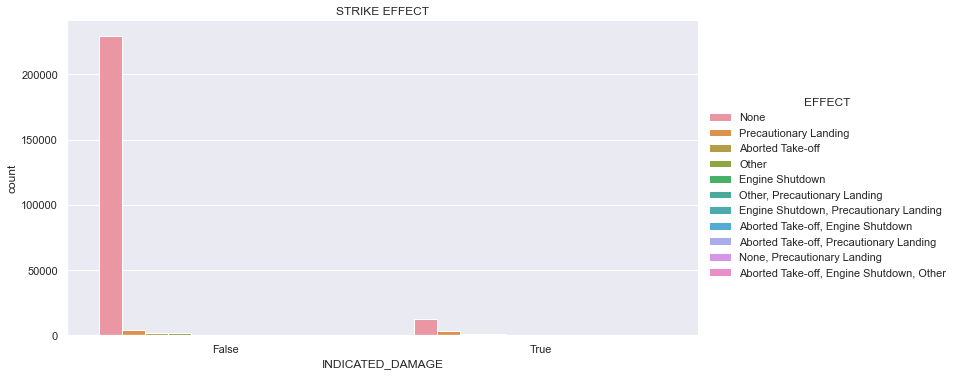

In [78]:
sns.catplot(x='INDICATED_DAMAGE', hue='EFFECT',kind='count',data=df, 
            height=5, aspect=2).set(title='STRIKE EFFECT')

In [79]:
fig.savefig('SPEF.png')

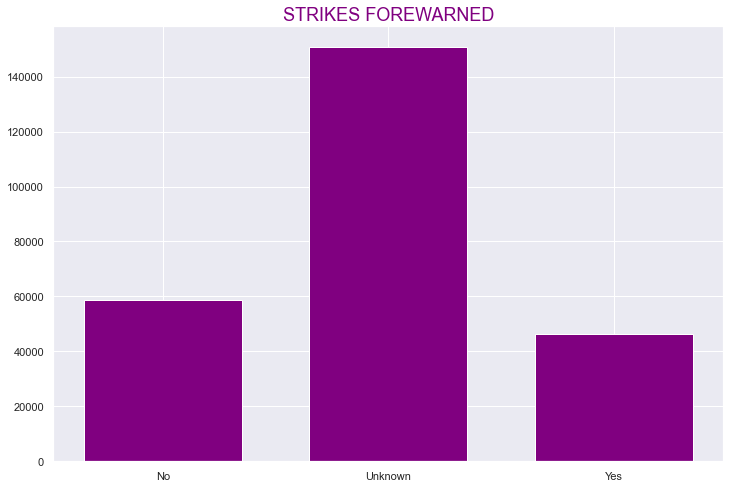

In [80]:
warned_bird_srike =Counter(df['WARNED'])
warned= list(warned_bird_srike.keys())
warned_strike=list(warned_bird_srike.values())

fig=plt.figure(figsize=(12,8))
plt.title('STRIKES FOREWARNED',fontsize=18,c='purple')
plt.bar(warned,warned_strike, edgecolor='w',width=0.7,color='purple')
plt.show()

In [82]:
fig.savefig('SPW.png')

In [70]:
df['INCIDENT_MONTH']

0         10
1          8
2          8
3          9
4          3
5         10
6          8
7          4
8          8
9          4
10         5
11         8
12         5
13         8
14         5
15         6
16         8
17         8
18         3
19         6
20        10
21         9
22         8
23         5
24         5
25         9
26         9
27         8
28         8
29        11
30         7
31         7
32         7
33         7
34         5
35         9
36        10
37         4
38         6
39        10
40         7
41         9
42        11
43         8
44         8
45         7
46         7
47         7
48        10
49         1
50        10
51        11
52         5
53         7
54        10
55         8
56        12
57         9
58         5
59         3
60         7
61         5
62         9
63         7
64        10
65         9
66         6
67         3
68        10
69        10
70         3
71        10
72         8
73         8
74         8
75         7
76         6

In [71]:
df['SEASON']=bird_strikes_season

In [72]:
df['SEASON'].value_counts()

Summer    89725
Fall      84399
Spring    55363
Winter    26442
Name: SEASON, dtype: int64

In [73]:
df['DAMAGE_RISK']=0

In [74]:
df['EFFECT'].unique()

array(['None', 'Precautionary Landing', 'Aborted Take-off', 'Other',
       'Engine Shutdown', 'Other, Precautionary Landing',
       'Engine Shutdown, Precautionary Landing',
       'Aborted Take-off, Engine Shutdown',
       'Aborted Take-off, Precautionary Landing',
       'None, Precautionary Landing',
       'Aborted Take-off, Engine Shutdown, Other'], dtype=object)

In [75]:
df['EFFECT'].value_counts()

None                                        242370
Precautionary Landing                         7315
Other                                         2971
Aborted Take-off                              2759
Engine Shutdown                                476
Engine Shutdown, Precautionary Landing          25
Other, Precautionary Landing                     9
Aborted Take-off, Precautionary Landing          1
Aborted Take-off, Engine Shutdown                1
Aborted Take-off, Engine Shutdown, Other         1
None, Precautionary Landing                      1
Name: EFFECT, dtype: int64

In [76]:
def risky(op):
    if (op['WARNED']=='Yes') & (op['EFFECT']!='None'):
        return 'High Risk'
    if (op['WARNED']=='Yes') & (op['EFFECT']=='None'):
        return 'Pontential Risk'
    if (op['WARNED']=='No') & (op['EFFECT']!='None'):
        return 'High Risk'
    if (op['WARNED']=='No') & (op['EFFECT']=='None'):
        return 'Low Risk'
    if (op['WARNED']=='Unknown') & (op['EFFECT']!='None'):
        return 'High Risk'
    if (op['WARNED']=='Unknown') & (op['EFFECT']=='None'):
        return 'Undetermined'

In [77]:
df['DAMAGE_RISK']=df.apply(risky,axis=1)

In [78]:
df['DAMAGE_RISK'].value_counts()

Undetermined       145418
Low Risk            53785
Pontential Risk     43167
High Risk           13559
Name: DAMAGE_RISK, dtype: int64

In [79]:
df['WARNED'].value_counts()

Unknown    150743
No          58847
Yes         46339
Name: WARNED, dtype: int64

In [80]:
df['DAMAGE_LEVEL'].value_counts()

N     237530
M       8412
M?      5791
S       4120
D         76
Name: DAMAGE_LEVEL, dtype: int64

In [81]:
#df2.to_csv('New.csv')

In [80]:
df3=df[['SEASON','DAMAGE_RISK','AIRPORT','INDICATED_DAMAGE','SKY','PRECIPITATION','TIME_OF_DAY','AIRCRAFT','NUM_ENGS',
      'TYPE_ENG','PHASE_OF_FLIGHT','DAMAGE_LEVEL','FAAREGION','ENG_1_POS','ENG_2_POS','ENG_3_POS','ENG_4_POS']]

In [81]:
df3.to_csv('StrikesDataML.csv')

In [86]:
df['PHASE_OF_FLIGHT'].unique()

array(['Approach', 'Landing Roll', 'Climb', 'En Route', 'Take-off Run',
       'Taxi', 'Descent', 'Parked', 'Local', 'Arrival', 'Departure',
       'Unknown'], dtype=object)

In [87]:
df['ENG_1_POS'].unique()

array([7., 5., 1., 4., 6., 2., 3.])

In [88]:
df['DAMAGE_RISK'].unique()

array(['Low Risk', 'Undetermined', 'High Risk', 'Pontential Risk'],
      dtype=object)